In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings ('ignore')

### Step1: Importing data  and inspecting data

In [2]:
leads=pd.read_csv('Leads.csv')
leads.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,...,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,...,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,...,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,...,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,...,No,Select,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,...,No,Select,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


In [3]:
leads.shape

(9240, 37)

In [4]:
leads.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 37 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9204 non-null   object 
 4   Do Not Email                                   9240 non-null   object 
 5   Do Not Call                                    9240 non-null   object 
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9103 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9103 

In [5]:
leads.describe()

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score
count,9240.000000,9240.000000,9103.000000,9240.000000,9103.000000,5022.000000,5022.000000
mean,617188.435606,0.385390,3.445238,487.698268,2.362820,14.306252,16.344883
std,23405.995698,0.486714,4.854853,548.021466,2.161418,1.386694,1.811395
min,579533.000000,0.000000,0.000000,0.000000,0.000000,7.000000,11.000000
25%,596484.500000,0.000000,1.000000,12.000000,1.000000,14.000000,15.000000
50%,615479.000000,0.000000,3.000000,248.000000,2.000000,14.000000,16.000000
75%,637387.250000,1.000000,5.000000,936.000000,3.000000,15.000000,18.000000
max,660737.000000,1.000000,251.000000,2272.000000,55.000000,18.000000,20.000000


In [6]:
leads.isnull().sum()

Prospect ID                                         0
Lead Number                                         0
Lead Origin                                         0
Lead Source                                        36
Do Not Email                                        0
Do Not Call                                         0
Converted                                           0
TotalVisits                                       137
Total Time Spent on Website                         0
Page Views Per Visit                              137
Last Activity                                     103
Country                                          2461
Specialization                                   1438
How did you hear about X Education               2207
What is your current occupation                  2690
What matters most to you in choosing a course    2709
Search                                              0
Magazine                                            0
Newspaper Article           

In [7]:
round(leads.isnull().sum()/leads.shape[0],2)

Prospect ID                                      0.00
Lead Number                                      0.00
Lead Origin                                      0.00
Lead Source                                      0.00
Do Not Email                                     0.00
Do Not Call                                      0.00
Converted                                        0.00
TotalVisits                                      0.01
Total Time Spent on Website                      0.00
Page Views Per Visit                             0.01
Last Activity                                    0.01
Country                                          0.27
Specialization                                   0.16
How did you hear about X Education               0.24
What is your current occupation                  0.29
What matters most to you in choosing a course    0.29
Search                                           0.00
Magazine                                         0.00
Newspaper Article           

### Step2 : Data Preparation

In [8]:
# Checking the labels of categorical columns
for col in leads.iloc[:,1:].select_dtypes(include='object').columns:
    print(col)
    print(leads[col].value_counts(normalize=True))

Lead Origin
Landing Page Submission    0.528788
API                        0.387446
Lead Add Form              0.077706
Lead Import                0.005952
Quick Add Form             0.000108
Name: Lead Origin, dtype: float64
Lead Source
Google               0.311604
Direct Traffic       0.276293
Olark Chat           0.190678
Organic Search       0.125380
Reference            0.058018
Welingak Website     0.015428
Referral Sites       0.013581
Facebook             0.005976
bing                 0.000652
google               0.000543
Click2call           0.000435
Press_Release        0.000217
Social Media         0.000217
Live Chat            0.000217
youtubechannel       0.000109
testone              0.000109
Pay per Click Ads    0.000109
welearnblog_Home     0.000109
WeLearn              0.000109
blog                 0.000109
NC_EDM               0.000109
Name: Lead Source, dtype: float64
Do Not Email
No     0.920563
Yes    0.079437
Name: Do Not Email, dtype: float64
Do Not Call
No    

In [9]:
# Coverting the variables with yes/no to 0 or 1
for feature in ['Do Not Email','Do Not Call','Search','Magazine','Newspaper Article','X Education Forums','Newspaper','Digital Advertisement','Through Recommendations','Receive More Updates About Our Courses','Update me on Supply Chain Content','Get updates on DM Content','I agree to pay the amount through cheque','A free copy of Mastering The Interview']:
    leads[feature]=leads[feature].apply(lambda x : 1 if x=='Yes' else 0)
leads.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,...,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,0,0,0,0.0,0,0.0,...,0,Select,Select,02.Medium,02.Medium,15.0,15.0,0,0,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,0,0,0,5.0,674,2.5,...,0,Select,Select,02.Medium,02.Medium,15.0,15.0,0,0,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,0,0,1,2.0,1532,2.0,...,0,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,0,1,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,0,0,0,1.0,305,1.0,...,0,Select,Mumbai,02.Medium,01.High,13.0,17.0,0,0,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,0,0,1,2.0,1428,1.0,...,0,Select,Mumbai,02.Medium,01.High,15.0,18.0,0,0,Modified


In [10]:
# Converting the selects into NaN
leads=leads.replace('select', np.nan)

In [11]:
leads.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 37 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9204 non-null   object 
 4   Do Not Email                                   9240 non-null   int64  
 5   Do Not Call                                    9240 non-null   int64  
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9103 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9103 

In [12]:
# dropping columns more than 70% null values
leads=leads.drop(leads.loc[:, list(round(leads.isnull().sum()/leads.shape[0],2)>0.7)].columns,1)

In [13]:
# Updating the lead quality variable from nan to Not sure
leads['Lead Quality']=leads['Lead Quality'].replace(np.nan, 'Not sure')

In [14]:
# dropping few columns which has high percentage of missing values
leads=leads.drop(['Asymmetrique Activity Index','Asymmetrique Profile Index','Asymmetrique Activity Score','Asymmetrique Profile Score'],1)

In [15]:
leads=leads.drop('Prospect ID',1)

In [16]:
leads=leads.drop('Last Notable Activity',1)

In [17]:
# we can impute Mumbai in city column as most of the values are from mumbai
leads['City']=leads['City'].replace(np.nan,'Mumbai')

In [18]:
# imputing nan in specialisation columns with others
leads['Specialization']=leads['Specialization'].replace(np.nan,'Other_Specialisation')

In [19]:
# for tags columns more 30% of data is 'will revert after reading the email' and we can impute nan with 'will revert after reading the email'
leads['Tags']=leads['Tags'].replace(np.nan, 'Will revert after reading the email')

In [20]:
# Most of the responses in What matters most to you in choosing a course column is better career prospects, imputing the nan
leads['What matters most to you in choosing a course']=leads['What matters most to you in choosing a course'].replace(np.nan, 'Better career prospects')

In [21]:
# most of responses in What is your current occupation column is unemplyed imputing nan with unemployed
leads['What is your current occupation']=leads['What is your current occupation'].replace(np.nan, 'Unemployed')

In [22]:
#More than 95% data in country is India, imputing null values with india
leads['Country']=leads['Country'].replace(np.nan,'India')

In [23]:
#in How did you hear about X Education columns many responses shows through online search we can impute null values with online search
leads['How did you hear about X Education']=leads['How did you hear about X Education'].replace(np.nan,'Online Search')

In [24]:
#In the column Lead Profile we can impute the null values with Yet to decide as it assigned by the company
leads['Lead Profile']=leads['Lead Profile'].replace(np.nan,'Yet to assign')

In [25]:
round(100*(leads.isnull().sum()/len(leads.index)),2)

Lead Number                                      0.00
Lead Origin                                      0.00
Lead Source                                      0.39
Do Not Email                                     0.00
Do Not Call                                      0.00
Converted                                        0.00
TotalVisits                                      1.48
Total Time Spent on Website                      0.00
Page Views Per Visit                             1.48
Last Activity                                    1.11
Country                                          0.00
Specialization                                   0.00
How did you hear about X Education               0.00
What is your current occupation                  0.00
What matters most to you in choosing a course    0.00
Search                                           0.00
Magazine                                         0.00
Newspaper Article                                0.00
X Education Forums          

In [26]:
# we can drop few columns as the missing values are less than 2%
leads.dropna(inplace=True)
leads.head()

,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,...,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,I agree to pay the amount through cheque,A free copy of Mastering The Interview
0,660737,API,Olark Chat,0,0,0,0.0,0,0.0,Page Visited on Website,...,0,0,Interested in other courses,Low in Relevance,0,0,Select,Select,0,0
1,660728,API,Organic Search,0,0,0,5.0,674,2.5,Email Opened,...,0,0,Ringing,Not sure,0,0,Select,Select,0,0
2,660727,Landing Page Submission,Direct Traffic,0,0,1,2.0,1532,2.0,Email Opened,...,0,0,Will revert after reading the email,Might be,0,0,Potential Lead,Mumbai,0,1
3,660719,Landing Page Submission,Direct Traffic,0,0,0,1.0,305,1.0,Unreachable,...,0,0,Ringing,Not Sure,0,0,Select,Mumbai,0,0
4,660681,Landing Page Submission,Google,0,0,1,2.0,1428,1.0,Converted to Lead,...,0,0,Will revert after reading the email,Might be,0,0,Select,Mumbai,0,0


 ## Step3: Exploratory data analysis

In [28]:
leads['Converted'].value_counts()

0    5639
1    3435
Name: Converted, dtype: int64

In [29]:
fig=plt.subplots(figsize=(12,12))

for i , feature in enumerate(['Lead Source', 'Lead Origin']):
    plt.subplot(3,3,i+1)
    plt.subplots_adjust(hspace=2.0)
    sns.countplot(leads[feature],hue=leads['Converted'])
    plt.xticks(rotation=90)
    plt.tight_layout()


ValueError: Cannot use `hue` without `x` and `y`

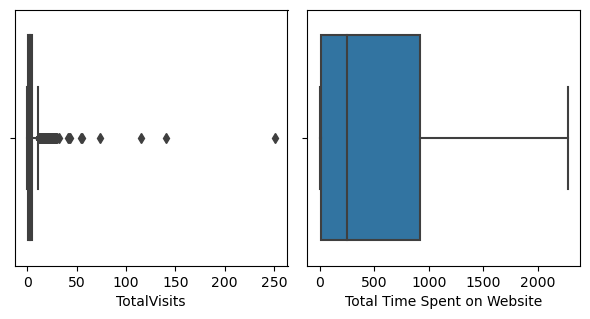

In [29]:
# Analysing total visits and total time spent on websites
fig=plt.subplots(figsize=(6,6))

for i, feature in enumerate(['TotalVisits','Total Time Spent on Website']):
    plt.subplot(2,2,i+1)
    plt.subplots_adjust(hspace=2.0)
    sns.boxplot(leads[feature])
    plt.tight_layout()

In [28]:
# There are many outliers in total visits column and capping this variable to 95%
q1=leads['TotalVisits'].quantile(0.95)
leads['TotalVisits'][leads['TotalVisits']>=q1]=q1

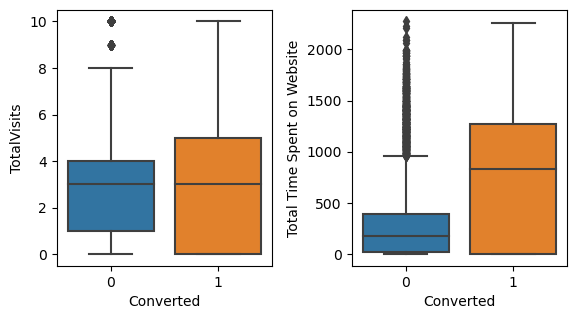

In [31]:
fig=plt.subplots(figsize=(6,6))
for i, feature in enumerate(['TotalVisits','Total Time Spent on Website']):
    plt.subplot(2,2, i+1)
    plt.subplots_adjust(hspace=2.0)
    sns.boxplot(y=feature, x='Converted', data=leads)
    plt.tight_layout()

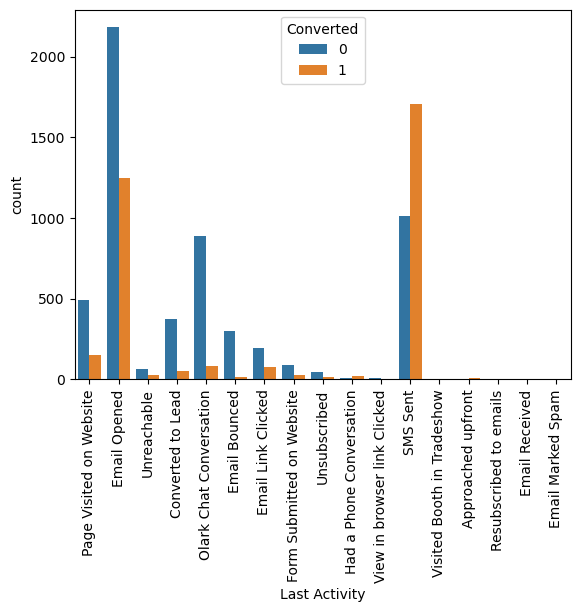

In [33]:
# Plotting the last activity
sns.countplot(x='Last Activity',hue='Converted', data=leads)
plt.xticks(rotation='vertical')
plt.show()

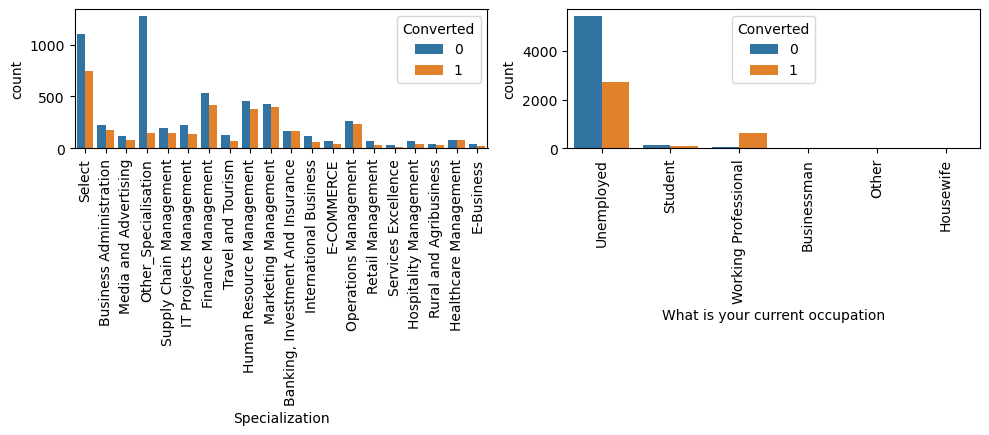

In [35]:
# Analysing specialisation and current occupation column
fig=plt.subplots(figsize=(10,6))

for i , feature in enumerate (['Specialization','What is your current occupation']):
    plt.subplot(2,2,i+1)
    plt.subplots_adjust(hspace=2.0)
    sns.countplot(x=feature, hue='Converted',data=leads)
    plt.xticks(rotation='vertical')
    plt.tight_layout()


In [30]:
round(100*(leads.isnull().sum()/len(leads.index)),2)

Lead Number                                      0.0
Lead Origin                                      0.0
Lead Source                                      0.0
Do Not Email                                     0.0
Do Not Call                                      0.0
Converted                                        0.0
TotalVisits                                      0.0
Total Time Spent on Website                      0.0
Page Views Per Visit                             0.0
Last Activity                                    0.0
Country                                          0.0
Specialization                                   0.0
How did you hear about X Education               0.0
What is your current occupation                  0.0
What matters most to you in choosing a course    0.0
Search                                           0.0
Magazine                                         0.0
Newspaper Article                                0.0
X Education Forums                            

In [31]:
leads[['Search','Magazine','Newspaper Article','X Education Forums','Newspaper','Digital Advertisement','Through Recommendations','Update me on Supply Chain Content','Get updates on DM Content','I agree to pay the amount through cheque','A free copy of Mastering The Interview']].describe()

,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Update me on Supply Chain Content,Get updates on DM Content,I agree to pay the amount through cheque,A free copy of Mastering The Interview
count,9074.000000,9074.0,9074.000000,9074.000000,9074.000000,9074.000000,9074.000000,9074.0,9074.0,9074.0,9074.000000
mean,0.001543,0.0,0.000220,0.000110,0.000110,0.000441,0.000771,0.0,0.0,0.0,0.318272
std,0.039251,0.0,0.014845,0.010498,0.010498,0.020992,0.027766,0.0,0.0,0.0,0.465831
min,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000
25%,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000
50%,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000
75%,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,1.000000
max,1.000000,0.0,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,0.0,0.0,1.000000


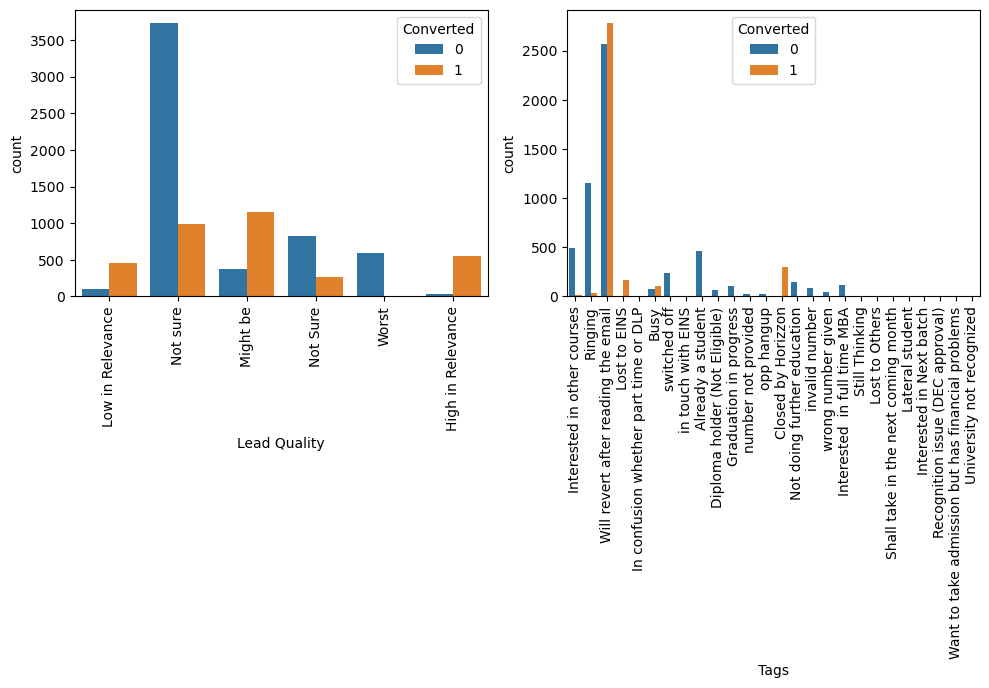

In [38]:
#Analysing lead quality and tags
fig=plt.subplots(figsize=(10,10))
for i, feature in enumerate (['Lead Quality','Tags']):
    plt.subplot(2,2,i+1)
    plt.subplots_adjust(hspace=2.0)
    sns.countplot(x=feature,hue='Converted',data=leads)
    plt.xticks(rotation='vertical')
    plt.tight_layout()


In [32]:
leads.columns

Index(['Lead Number', 'Lead Origin', 'Lead Source', 'Do Not Email',
       'Do Not Call', 'Converted', 'TotalVisits',
       'Total Time Spent on Website', 'Page Views Per Visit', 'Last Activity',
       'Country', 'Specialization', 'How did you hear about X Education',
       'What is your current occupation',
       'What matters most to you in choosing a course', 'Search', 'Magazine',
       'Newspaper Article', 'X Education Forums', 'Newspaper',
       'Digital Advertisement', 'Through Recommendations',
       'Receive More Updates About Our Courses', 'Tags', 'Lead Quality',
       'Update me on Supply Chain Content', 'Get updates on DM Content',
       'Lead Profile', 'City', 'I agree to pay the amount through cheque',
       'A free copy of Mastering The Interview'],
      dtype='object')

In [33]:
leads.head()

,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,...,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,I agree to pay the amount through cheque,A free copy of Mastering The Interview
0,660737,API,Olark Chat,0,0,0,0.0,0,0.0,Page Visited on Website,...,0,0,Interested in other courses,Low in Relevance,0,0,Select,Select,0,0
1,660728,API,Organic Search,0,0,0,5.0,674,2.5,Email Opened,...,0,0,Ringing,Not sure,0,0,Select,Select,0,0
2,660727,Landing Page Submission,Direct Traffic,0,0,1,2.0,1532,2.0,Email Opened,...,0,0,Will revert after reading the email,Might be,0,0,Potential Lead,Mumbai,0,1
3,660719,Landing Page Submission,Direct Traffic,0,0,0,1.0,305,1.0,Unreachable,...,0,0,Ringing,Not Sure,0,0,Select,Mumbai,0,0
4,660681,Landing Page Submission,Google,0,0,1,2.0,1428,1.0,Converted to Lead,...,0,0,Will revert after reading the email,Might be,0,0,Select,Mumbai,0,0


In [35]:
leads['Country'].unique()

array(['India', 'Russia', 'Kuwait', 'Oman', 'United Arab Emirates',
       'United States', 'Australia', 'United Kingdom', 'Bahrain', 'Ghana',
       'Singapore', 'Qatar', 'Saudi Arabia', 'Belgium', 'France',
       'Sri Lanka', 'China', 'Canada', 'Netherlands', 'Sweden', 'Nigeria',
       'Hong Kong', 'Germany', 'Asia/Pacific Region', 'Uganda', 'Kenya',
       'Italy', 'South Africa', 'Tanzania', 'unknown', 'Malaysia',
       'Liberia', 'Switzerland', 'Denmark', 'Philippines', 'Bangladesh',
       'Vietnam', 'Indonesia'], dtype=object)

In [36]:
# Creating a dummy variable for some of the categorical variables and dropping the first one.
leads_dummy = pd.get_dummies(leads, drop_first=True)

In [37]:
leads_dummy.head()

,Lead Number,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Search,Magazine,Newspaper Article,...,Lead Profile_Potential Lead,Lead Profile_Select,Lead Profile_Student of SomeSchool,Lead Profile_Yet to assign,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Select,City_Thane & Outskirts,City_Tier II Cities
0,660737,0,0,0,0.0,0,0.0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
1,660728,0,0,0,5.0,674,2.5,0,0,0,...,0,1,0,0,0,0,0,1,0,0
2,660727,0,0,1,2.0,1532,2.0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
3,660719,0,0,0,1.0,305,1.0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,660681,0,0,1,2.0,1428,1.0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


In [38]:
leads_dummy=leads_dummy.drop(['City_Select','Lead Profile_Select','Specialization_Select','How did you hear about X Education_Select'],axis=1)

### Step 4: Test-Train Split

In [39]:
from sklearn.model_selection import train_test_split

In [40]:
# Putting feature variable to X
X = leads_dummy.drop(['Converted','Lead Number'], axis=1)

X.head()

,Do Not Email,Do Not Call,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,...,Lead Profile_Lateral Student,Lead Profile_Other Leads,Lead Profile_Potential Lead,Lead Profile_Student of SomeSchool,Lead Profile_Yet to assign,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities
0,0,0,0.0,0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,5.0,674,2.5,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,2.0,1532,2.0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,0,0,1.0,305,1.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,2.0,1428,1.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [41]:
# Putting response variable to y
y = leads_dummy['Converted']

y.head()

0    0
1    0
2    1
3    0
4    1
Name: Converted, dtype: int64

In [42]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

In [43]:
X_train.describe()

,Do Not Email,Do Not Call,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,...,Lead Profile_Lateral Student,Lead Profile_Other Leads,Lead Profile_Potential Lead,Lead Profile_Student of SomeSchool,Lead Profile_Yet to assign,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities
count,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.0,6351.000000,6351.000000,6351.000000,...,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000
mean,0.078885,0.000315,3.471579,484.344198,2.377104,0.001575,0.0,0.000315,0.000157,0.000157,...,0.002204,0.052118,0.170839,0.025035,0.294914,0.074476,0.048181,0.041883,0.078885,0.008030
std,0.269581,0.017744,5.171189,545.076458,2.099082,0.039653,0.0,0.017744,0.012548,0.012548,...,0.046903,0.222282,0.376398,0.156245,0.456040,0.262565,0.214166,0.200338,0.269581,0.089258
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,1.000000,10.000000,1.000000,0.000000,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,3.000000,247.000000,2.000000,0.000000,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,5.000000,920.500000,3.330000,0.000000,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,251.000000,2226.000000,24.000000,1.000000,0.0,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [44]:
X_train.columns

Index(['Do Not Email', 'Do Not Call', 'TotalVisits',
       'Total Time Spent on Website', 'Page Views Per Visit', 'Search',
       'Magazine', 'Newspaper Article', 'X Education Forums', 'Newspaper',
       ...
       'Lead Profile_Lateral Student', 'Lead Profile_Other Leads',
       'Lead Profile_Potential Lead', 'Lead Profile_Student of SomeSchool',
       'Lead Profile_Yet to assign', 'City_Other Cities',
       'City_Other Cities of Maharashtra', 'City_Other Metro Cities',
       'City_Thane & Outskirts', 'City_Tier II Cities'],
      dtype='object', length=167)

In [45]:
pd.set_option("display.max_columns",None)

### Step 5: Feature Scaling

In [46]:
from sklearn.preprocessing import StandardScaler

In [47]:
scaler = StandardScaler()

X_train[['TotalVisits','Total Time Spent on Website', 'Page Views Per Visit']] = scaler.fit_transform(X_train[['TotalVisits','Total Time Spent on Website', 'Page Views Per Visit']])

X_train.head()

,Do Not Email,Do Not Call,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Update me on Supply Chain Content,Get updates on DM Content,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Live Chat,Lead Source_NC_EDM,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Pay per Click Ads,Lead Source_Press_Release,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Social Media,Lead Source_WeLearn,Lead Source_Welingak Website,Lead Source_bing,Lead Source_blog,Lead Source_google,Lead Source_testone,Lead Source_welearnblog_Home,Lead Source_youtubechannel,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Marked Spam,Last Activity_Email Opened,Last Activity_Email Received,Last Activity_Form Submitted on Website,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Page Visited on Website,Last Activity_Resubscribed to emails,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,Last Activity_View in browser link Clicked,Last Activity_Visited Booth in Tradeshow,Country_Australia,Country_Bahrain,Country_Bangladesh,Country_Belgium,Country_Canada,Country_China,Country_Denmark,Country_France,Country_Germany,Country_Ghana,Country_Hong Kong,Country_India,Country_Indonesia,Country_Italy,Country_Kenya,Country_Kuwait,Country_Liberia,Country_Malaysia,Country_Netherlands,Country_Nigeria,Country_Oman,Country_Philippines,Country_Qatar,Country_Russia,Country_Saudi Arabia,Country_Singapore,Country_South Africa,Country_Sri Lanka,Country_Sweden,Country_Switzerland,Country_Tanzania,Country_Uganda,Country_United Arab Emirates,Country_United Kingdom,Country_United States,Country_Vietnam,Country_unknown,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Other_Specialisation,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,How did you hear about X Education_Email,How did you hear about X Education_Multiple Sources,How did you hear about X Education_Online Search,How did you hear about X Education_Other,How did you hear about X Education_SMS,How did you hear about X Education_Social Media,How did you hear about X Education_Student of SomeSchool,How did you hear about X Education_Word Of Mouth,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,What matters most to you in choosing a course_Better career prospects,What matters most to you in choosing a course_Flexibility & Convenience,What matters most to you in choosing a course_Other,Tags_Busy,Tags_Closed by Horizzon,Tags_Diploma holder (Not Eligible),Tags_Graduation in progress,Tags_In confusion whether part time or DLP,Tags_Interested in full time MBA,Tags_Interested in Next batch,Tags_Interested in other courses,Tags_Lateral student,Tags_Lost to EINS,Tags_Lost to Others,Tags_Not doing further education,Tags_Recognition issue (DEC approval),Tags_Ringing,Tags_Shall take in the next coming month,Tags_Still Thinking,Tags_University not recognized,Tags_Wa

In [48]:
### Checking the Churn Rate
churn = (sum(leads_dummy['Converted'])/len(leads_dummy['Converted'].index))*100
churn

37.85541106458012

We have a conversion rate of 38% already.

### Step 6: Looking at Correlations

In [49]:
# Importing matplotlib and seaborn
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [106]:
# Let's see the correlation matrix 
plt.figure(figsize = (200,100))        # Size of the figure
sns.heatmap(leads_dummy.corr(),annot = True)
plt.show()

### Step 7: Model Building
Let's start by splitting our data into a training set and a test set.

#### Running Your First Training Model

In [50]:
import statsmodels.api as sm

In [51]:
# Logistic regression model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6351
Model:                            GLM   Df Residuals:                     6194
Model Family:                Binomial   Df Model:                          156
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Mon, 18 Sep 2023   Deviance:                       46236.
Time:                        15:22:33   Pearson chi2:                 2.26e+18
No. Iterations:                   100   Pseudo R-squ. (CS):                nan
Covariance Type:            nonrobust                                         
===========================================================================================================================================
                                                                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------------------------------
const                                                                    4.694e+15   8.89e+07   5.28e+07      0.000    4.69e+15    4.69e+15
Do Not Email                                                            -4.612e+14   4.49e+06  -1.03e+08      0.000   -4.61e+14   -4.61e+14
Do Not Call                                                              3.061e+15   4.79e+07   6.39e+07      0.000    3.06e+15    3.06e+15
TotalVisits                                                                2.4e+13   9.89e+05   2.43e+07      0.000     2.4e+13     2.4e+13
Total Time Spent on Website                                              1.662e+14   1.04e+06    1.6e+08      0.000    1.66e+14    1.66e+14
Page Views Per Visit                                                    -2.057e+12   1.26e+06  -1.63e+06      0.000   -2.06e+12   -2.06e+12
Search                                                                   -5.59e+14   2.39e+07  -2.34e+07      0.000   -5.59e+14   -5.59e+14
Magazine                                                                  -54.6011   2.31e-06  -2.36e+07      0.000     -54.601     -54.601
Newspaper Article                                                        3.889e+15   6.74e+07   5.77e+07      0.000    3.89e+15    3.89e+15
X Education Forums                                                      -6.831e+15   1.13e+08  -6.04e+07      0.000   -6.83e+15   -6.83e+15
Newspaper                                                               -3.772e+15   6.74e+07   -5.6e+07      0.000   -3.77e+15   -3.77e+15
Digital Advertisement                                                    5.021e+14   4.81e+07   1.04e+07      0.000    5.02e+14    5.02e+14
Through Recommendations                                                 -4.964e+14   3.58e+07  -1.39e+07      0.000   -4.96e+14   -4.96e+14
Receive More Updates About Our Courses                                    -63.1687   3.28e-06  -1.93e+07      0.000     -63.169     -63.169
Update me on Supply Chain Content                                          12.2689   1.45e-06   8.47e+06      0.000      12.269      12.269
Get updates on DM Content                                                 -49.5110   7.16e-07  -6.92e+07      0.000     -49.511     -49.511
I agree to pay the amount through cheque                                   24.8322    1.2e-06   2.06e+07      0.000      24.832      24.832
A free copy of Mastering The Interview                                  -5.193e+13   2.97e+06  -1.75e+07      0.000   -5.19e+13   -5.19e+13
Lead Origin_Landing Page Submission                                     -2.349e+14    3.6e+06  -6.52e+07      0.000   -2.35e+14   -2.35e+14
Lea

### Step 8: Feature Selection Using RFE

In [52]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()

In [53]:
from sklearn.feature_selection import RFE
rfe = RFE(logreg,step=1)
rfe = rfe.fit(X_train, y_train)

In [54]:
rfe.support_

array([ True, False, False,  True, False,  True, False, False, False,
       False, False, False, False, False, False, False,  True,  True,
        True, False,  True,  True,  True, False,  True,  True,  True,
       False, False, False, False, False, False,  True, False, False,
        True, False, False, False,  True,  True,  True, False, False,
       False,  True,  True,  True,  True,  True,  True,  True,  True,
       False, False,  True, False, False, False,  True, False, False,
       False,  True, False, False, False, False,  True, False, False,
       False, False, False, False,  True, False, False, False,  True,
        True,  True, False, False, False, False, False,  True,  True,
        True, False,  True, False, False,  True, False,  True, False,
       False,  True, False,  True, False,  True, False, False,  True,
       False,  True,  True, False,  True, False,  True,  True, False,
        True, False,  True,  True, False,  True,  True,  True, False,
       False,  True,

In [55]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('Do Not Email', True, 1),
 ('Do Not Call', False, 41),
 ('TotalVisits', False, 20),
 ('Total Time Spent on Website', True, 1),
 ('Page Views Per Visit', False, 39),
 ('Search', True, 1),
 ('Magazine', False, 79),
 ('Newspaper Article', False, 65),
 ('X Education Forums', False, 34),
 ('Newspaper', False, 33),
 ('Digital Advertisement', False, 26),
 ('Through Recommendations', False, 54),
 ('Receive More Updates About Our Courses', False, 76),
 ('Update me on Supply Chain Content', False, 85),
 ('Get updates on DM Content', False, 77),
 ('I agree to pay the amount through cheque', False, 78),
 ('A free copy of Mastering The Interview', True, 1),
 ('Lead Origin_Landing Page Submission', True, 1),
 ('Lead Origin_Lead Add Form', True, 1),
 ('Lead Origin_Lead Import', False, 61),
 ('Lead Source_Direct Traffic', True, 1),
 ('Lead Source_Facebook', True, 1),
 ('Lead Source_Google', True, 1),
 ('Lead Source_Live Chat', False, 52),
 ('Lead Source_NC_EDM', True, 1),
 ('Lead Source_Olark Chat',

In [56]:
col = X_train.columns[rfe.support_]

In [57]:
col

Index(['Do Not Email', 'Total Time Spent on Website', 'Search',
       'A free copy of Mastering The Interview',
       'Lead Origin_Landing Page Submission', 'Lead Origin_Lead Add Form',
       'Lead Source_Direct Traffic', 'Lead Source_Facebook',
       'Lead Source_Google', 'Lead Source_NC_EDM', 'Lead Source_Olark Chat',
       'Lead Source_Organic Search', 'Lead Source_Welingak Website',
       'Lead Source_google', 'Last Activity_Converted to Lead',
       'Last Activity_Email Bounced', 'Last Activity_Email Link Clicked',
       'Last Activity_Form Submitted on Website',
       'Last Activity_Had a Phone Conversation',
       'Last Activity_Olark Chat Conversation',
       'Last Activity_Page Visited on Website',
       'Last Activity_Resubscribed to emails', 'Last Activity_SMS Sent',
       'Last Activity_Unreachable', 'Last Activity_Unsubscribed',
       'Country_Australia', 'Country_Canada', 'Country_Germany',
       'Country_Italy', 'Country_Oman', 'Country_Saudi Arabia',
    

In [58]:
X_train.columns[~rfe.support_]

Index(['Do Not Call', 'TotalVisits', 'Page Views Per Visit', 'Magazine',
       'Newspaper Article', 'X Education Forums', 'Newspaper',
       'Digital Advertisement', 'Through Recommendations',
       'Receive More Updates About Our Courses',
       'Update me on Supply Chain Content', 'Get updates on DM Content',
       'I agree to pay the amount through cheque', 'Lead Origin_Lead Import',
       'Lead Source_Live Chat', 'Lead Source_Pay per Click Ads',
       'Lead Source_Press_Release', 'Lead Source_Reference',
       'Lead Source_Referral Sites', 'Lead Source_Social Media',
       'Lead Source_WeLearn', 'Lead Source_bing', 'Lead Source_blog',
       'Lead Source_testone', 'Lead Source_welearnblog_Home',
       'Lead Source_youtubechannel', 'Last Activity_Email Marked Spam',
       'Last Activity_Email Opened', 'Last Activity_Email Received',
       'Last Activity_View in browser link Clicked',
       'Last Activity_Visited Booth in Tradeshow', 'Country_Bahrain',
       'Country_Ba

##### Assessing the model with StatsModels

In [59]:
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6351
Model:                            GLM   Df Residuals:                     6268
Model Family:                Binomial   Df Model:                           82
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Mon, 18 Sep 2023   Deviance:                       60696.
Time:                        15:28:44   Pearson chi2:                 2.97e+18
No. Iterations:                   100   Pseudo R-squ. (CS):                nan
Covariance Type:            nonrobust                                         
=========================================================================================================================================
                                                                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------------------------------
const                                                                  6.926e+13   1.05e+07    6.6e+06      0.000    6.93e+13    6.93e+13
Do Not Email                                                          -6.616e+14   4.43e+06  -1.49e+08      0.000   -6.62e+14   -6.62e+14
Total Time Spent on Website                                            5.189e+14   1.03e+06   5.04e+08      0.000    5.19e+14    5.19e+14
Search                                                                -8.139e+14   2.13e+07  -3.81e+07      0.000   -8.14e+14   -8.14e+14
A free copy of Mastering The Interview                                 -1.16e+14   2.69e+06  -4.32e+07      0.000   -1.16e+14   -1.16e+14
Lead Origin_Landing Page Submission                                   -2.444e+14   2.78e+06  -8.78e+07      0.000   -2.44e+14   -2.44e+14
Lead Origin_Lead Add Form                                             -8.562e+13   8.18e+06  -1.05e+07      0.000   -8.56e+13   -8.56e+13
Lead Source_Direct Traffic                                            -1.899e+14    7.3e+06   -2.6e+07      0.000    -1.9e+14    -1.9e+14
Lead Source_Facebook                                                   1.416e+14   1.52e+07   9.31e+06      0.000    1.42e+14    1.42e+14
Lead Source_Google                                                    -1.448e+14   7.08e+06  -2.04e+07      0.000   -1.45e+14   -1.45e+14
Lead Source_NC_EDM                                                     8.081e+15   6.75e+07    1.2e+08      0.000    8.08e+15    8.08e+15
Lead Source_Olark Chat                                                -1.464e+14   7.26e+06  -2.02e+07      0.000   -1.46e+14   -1.46e+14
Lead Source_Organic Search                                            -1.896e+14   7.32e+06  -2.59e+07      0.000    -1.9e+14    -1.9e+14
Lead Source_Welingak Website                                            9.87e+14   8.05e+06   1.23e+08      0.000    9.87e+14    9.87e+14
Lead Source_google                                                    -4.432e+15   3.46e+07  -1.28e+08      0.000   -4.43e+15   -4.43e+15
Last Activity_Converted to Lead                                       -4.024e+14   4.33e+06  -9.29e+07      0.000   -4.02e+14   -4.02e+14
Last Activity_Email Bounced                                             3.75e+13   6.44e+06   5.83e+06      0.000    3.75e+13    3.75e+13
Last Activity_Email Link Clicked                                       2.384e+14   5.25e+06   4.54e+07      0.000    2.38e+14    2.38e+14
Last Activity_Form Submitted on Website                               -2.693e+14   7.98e+06  -3.37e+07      0.000   -2.69e+14   -2.69e+14
Last Activity_Had a Phone Conversation         

In [60]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

3009    0.0
1012    0.0
9226    0.0
4750    1.0
7987    1.0
1281    1.0
2880    0.0
4971    1.0
7536    1.0
1248    0.0
dtype: float64

In [61]:
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0., 0., 0., 1., 1., 1., 0., 1., 1., 0.])

##### Creating a dataframe with the actual churn flag and the predicted probabilities

In [62]:
y_train_pred_final = pd.DataFrame({'Converted':y_train.values, 'Converted_Prob':y_train_pred})
y_train_pred_final['Lead_Number'] = y_train.index
y_train_pred_final.head()

,Converted,Converted_Prob,Lead_Number
0,0,0.0,3009
1,0,0.0,1012
2,0,0.0,9226
3,1,1.0,4750
4,1,1.0,7987


##### Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0

In [63]:
y_train_pred_final['predicted'] = y_train_pred_final.Converted_Prob.map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final.head()

,Converted,Converted_Prob,Lead_Number,predicted
0,0,0.0,3009,0
1,0,0.0,1012,0
2,0,0.0,9226,0
3,1,1.0,4750,1
4,1,1.0,7987,1


In [64]:
from sklearn import metrics

In [65]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.predicted )
print(confusion)

[[3652  253]
 [ 406 2040]]


In [66]:
# Predicted     not_churn    churn
# Actual
# not_churn        3270      365
# churn            579       708  

In [67]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.predicted))

0.8962368131002991


#### Checking VIFs

In [68]:
# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [69]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
81,Lead Profile_Yet to assign,inf
53,What matters most to you in choosing a course_...,inf
51,What is your current occupation_Unemployed,33.42
66,Tags_Will revert after reading the email,17.52
8,Lead Source_Google,13.96
...,...,...
36,Country_unknown,1.01
29,Country_Oman,1.01
9,Lead Source_NC_EDM,1.01
2,Search,1.01


There are a few variables with high VIF. It's best to drop these variables as they aren't helping much with prediction and unnecessarily making the model complex. The variable 'PhoneService' has the highest VIF. So let's start by dropping that.

In [70]:
col = col.drop('Lead Profile_Yet to assign', 1)
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif


,Features,VIF
51,What is your current occupation_Unemployed,33.42
66,Tags_Will revert after reading the email,17.52
8,Lead Source_Google,13.96
6,Lead Source_Direct Traffic,13.34
75,Lead Quality_Not sure,10.48
...,...,...
21,Last Activity_Resubscribed to emails,1.01
31,Country_Singapore,1.01
25,Country_Australia,1.01
27,Country_Germany,1.01


In [71]:
col = col.drop('What is your current occupation_Unemployed', 1)
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
65,Tags_Will revert after reading the email,15.69
6,Lead Source_Direct Traffic,10.72
8,Lead Source_Google,10.67
74,Lead Quality_Not sure,9.75
10,Lead Source_Olark Chat,6.67
...,...,...
31,Country_Singapore,1.01
32,Country_South Africa,1.01
9,Lead Source_NC_EDM,1.01
36,Country_unknown,1.01


In [72]:
col = col.drop('Tags_Will revert after reading the email', 1)
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif


,Features,VIF
73,Lead Quality_Not sure,9.73
6,Lead Source_Direct Traffic,7.41
8,Lead Source_Google,6.34
4,Lead Origin_Landing Page Submission,5.81
10,Lead Source_Olark Chat,3.86
...,...,...
57,Tags_Interested in Next batch,1.01
65,Tags_in touch with EINS,1.01
64,Tags_Want to take admission but has financial ...,1.01
29,Country_Oman,1.01


In [73]:
col = col.drop('Lead Quality_Not sure', 1)
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif


,Features,VIF
4,Lead Origin_Landing Page Submission,5.80
6,Lead Source_Direct Traffic,5.16
8,Lead Source_Google,3.74
3,A free copy of Mastering The Interview,3.20
52,What matters most to you in choosing a course_...,2.75
...,...,...
64,Tags_Want to take admission but has financial ...,1.01
21,Last Activity_Resubscribed to emails,1.01
25,Country_Australia,1.01
27,Country_Germany,1.01


In [74]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6351
Model:                            GLM   Df Residuals:                     6271
Model Family:                Binomial   Df Model:                           79
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1183.3
Date:                Mon, 18 Sep 2023   Deviance:                       2366.7
Time:                        15:30:36   Pearson chi2:                 1.48e+04
No. Iterations:                    24   Pseudo R-squ. (CS):             0.6173
Covariance Type:            nonrobust                                         
=========================================================================================================================================
                                                                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------------------------------
const                                                                     0.7443      0.448      1.660      0.097      -0.135       1.623
Do Not Email                                                             -1.7596      0.339     -5.185      0.000      -2.425      -1.094
Total Time Spent on Website                                               1.1890      0.065     18.390      0.000       1.062       1.316
Search                                                                   -1.2621      1.974     -0.639      0.523      -5.131       2.607
A free copy of Mastering The Interview                                   -0.4857      0.177     -2.750      0.006      -0.832      -0.140
Lead Origin_Landing Page Submission                                      -0.2254      0.175     -1.291      0.197      -0.568       0.117
Lead Origin_Lead Add Form                                                 1.2350      0.580      2.130      0.033       0.098       2.372
Lead Source_Direct Traffic                                               -0.6463      0.460     -1.404      0.160      -1.548       0.256
Lead Source_Facebook                                                     -0.6191      0.806     -0.768      0.442      -2.199       0.960
Lead Source_Google                                                       -0.3498      0.446     -0.784      0.433      -1.224       0.524
Lead Source_NC_EDM                                                       26.9454   2.16e+05      0.000      1.000   -4.23e+05    4.23e+05
Lead Source_Olark Chat                                                    0.6265      0.453      1.384      0.166      -0.261       1.514
Lead Source_Organic Search                                               -0.4291      0.462     -0.930      0.353      -1.334       0.476
Lead Source_Welingak Website                                              1.9212      0.830      2.315      0.021       0.295       3.548
Lead Source_google                                                      -23.3205   1.03e+05     -0.000      1.000   -2.02e+05    2.02e+05
Last Activity_Converted to Lead                                          -1.2488      0.313     -3.987      0.000      -1.863      -0.635
Last Activity_Email Bounced                                              -0.0090      0.559     -0.016      0.987      -1.104       1.086
Last Activity_Email Link Clicked                                         -0.5896      0.327     -1.806      0.071      -1.230       0.050
Last Activity_Form Submitted on Website                                  -1.5184      0.489     -3.105      0.002      -2.477      -0.560
Last Activity_Had a Phone Conversation         

In [75]:
y_train_pred = res.predict(X_train_sm).values.reshape(-1)

In [76]:
y_train_pred[:10]

array([0.02469352, 0.01618557, 0.02608476, 0.69866406, 0.9999797 ,
       0.98561833, 0.02294832, 0.91490837, 0.9899477 , 0.07373091])

In [77]:
y_train_pred_final['Converted_Prob'] = y_train_pred

In [78]:
# Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0
y_train_pred_final['predicted'] = y_train_pred_final.Converted_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Converted,Converted_Prob,Lead_Number,predicted
0,0,0.024694,3009,0
1,0,0.016186,1012,0
2,0,0.026085,9226,0
3,1,0.698664,4750,1
4,1,0.999980,7987,1


In [79]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.predicted))

0.9288301054951976


So overall the accuracy hasn't dropped much.

## Metrics beyond simply accuracy

In [80]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [81]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.8340147179067866

In [82]:
# Let us calculate specificity
TN / float(TN+FP)

0.9352112676056338

In [83]:
# Calculate false postive rate - predicting churn when customer does not have churned
print(FP/ float(TN+FP))

0.0647887323943662


In [84]:
# positive predictive value 
print (TP / float(TP+FP))

0.8896641953772351


In [85]:
# Negative predictive value
print (TN / float(TN+ FN))

0.8999507146377526


### Step 9: Plotting the ROC Curve

An ROC curve demonstrates several things:

- It shows the tradeoff between sensitivity and specificity (any increase in sensitivity will be accompanied by a decrease in specificity).
- The closer the curve follows the left-hand border and then the top border of the ROC space, the more accurate the test.
- The closer the curve comes to the 45-degree diagonal of the ROC space, the less accurate the test.

In [86]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [87]:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Converted, y_train_pred_final.Converted_Prob, drop_intermediate = False )

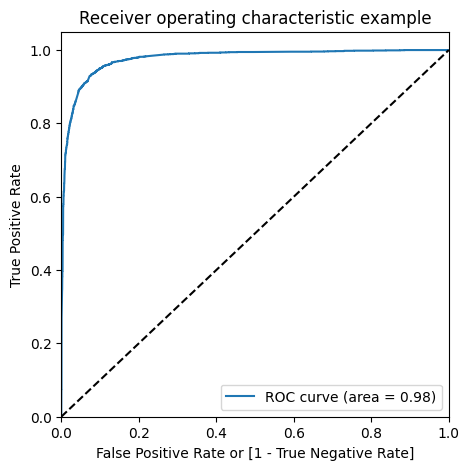

In [88]:
draw_roc(y_train_pred_final.Converted, y_train_pred_final.Converted_Prob)

### Step 10: Finding Optimal Cutoff Point

Optimal cutoff probability is that prob where we get balanced sensitivity and specificity

In [89]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Converted_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Converted,Converted_Prob,Lead_Number,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.024694,3009,0,1,0,0,0,0,0,0,0,0,0
1,0,0.016186,1012,0,1,0,0,0,0,0,0,0,0,0
2,0,0.026085,9226,0,1,0,0,0,0,0,0,0,0,0
3,1,0.698664,4750,1,1,1,1,1,1,1,1,0,0,0
4,1,0.999980,7987,1,1,1,1,1,1,1,1,1,1,1


In [90]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.385136  1.000000  0.000000
0.1   0.1  0.872304  0.979558  0.805122
0.2   0.2  0.906471  0.965658  0.869398
0.3   0.3  0.921587  0.944399  0.907298
0.4   0.4  0.925524  0.915781  0.931626
0.5   0.5  0.928830  0.896566  0.949040
0.6   0.6  0.922847  0.856909  0.964149
0.7   0.7  0.917021  0.831971  0.970294
0.8   0.8  0.905054  0.785773  0.979770
0.9   0.9  0.880491  0.706051  0.989757


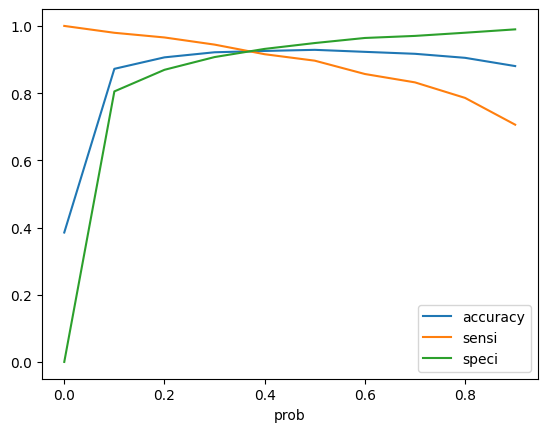

In [91]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

#### From the curve above, 0.3 is the optimum point to take it as a cutoff probability.

In [92]:
y_train_pred_final['final_predicted'] = y_train_pred_final.Converted_Prob.map( lambda x: 1 if x > 0.38 else 0)

y_train_pred_final.head()

,Converted,Converted_Prob,Lead_Number,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0.024694,3009,0,1,0,0,0,0,0,0,0,0,0,0
1,0,0.016186,1012,0,1,0,0,0,0,0,0,0,0,0,0
2,0,0.026085,9226,0,1,0,0,0,0,0,0,0,0,0,0
3,1,0.698664,4750,1,1,1,1,1,1,1,1,0,0,0,1
4,1,0.999980,7987,1,1,1,1,1,1,1,1,1,1,1,1


In [93]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.final_predicted)

0.9263108171941427

In [94]:
confusion2 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.final_predicted )
confusion2

array([[3607,  298],
       [ 170, 2276]])

In [95]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [96]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.9304987735077678

In [97]:
# Let us calculate specificity
TN / float(TN+FP)

0.9236875800256082

In [98]:
# Calculate false postive rate - predicting churn when customer does not have churned
print(FP/ float(TN+FP))

0.07631241997439181


In [99]:
# Positive predictive value 
print (TP / float(TP+FP))

0.8842268842268842


In [100]:
# Negative predictive value
print (TN / float(TN+ FN))

0.9549907333862854


## Precision and Recall

In [305]:
#Looking at the confusion matrix again

In [101]:
confusion = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.predicted )
confusion

array([[3706,  199],
       [ 253, 2193]])

##### Precision
TP / TP + FP

In [102]:
confusion[1,1]/(confusion[0,1]+confusion[1,1])

0.9168060200668896

##### Recall
TP / TP + FN

In [103]:
confusion[1,1]/(confusion[1,0]+confusion[1,1])

0.8965658217497956

Using sklearn utilities for the same

In [104]:
from sklearn.metrics import precision_score, recall_score

In [105]:
precision_score(y_train_pred_final.Converted, y_train_pred_final.predicted)

0.9168060200668896

In [106]:
recall_score(y_train_pred_final.Converted, y_train_pred_final.predicted)

0.8965658217497956

### Precision and recall tradeoff

In [107]:
from sklearn.metrics import precision_recall_curve

In [108]:
y_train_pred_final.Converted, y_train_pred_final.predicted

(0       0
 1       0
 2       0
 3       1
 4       1
        ..
 6346    0
 6347    1
 6348    0
 6349    0
 6350    0
 Name: Converted, Length: 6351, dtype: int64,
 0       0
 1       0
 2       0
 3       1
 4       1
        ..
 6346    0
 6347    1
 6348    0
 6349    0
 6350    0
 Name: predicted, Length: 6351, dtype: int64)

In [109]:
p, r, thresholds = precision_recall_curve(y_train_pred_final.Converted, y_train_pred_final.Converted_Prob)

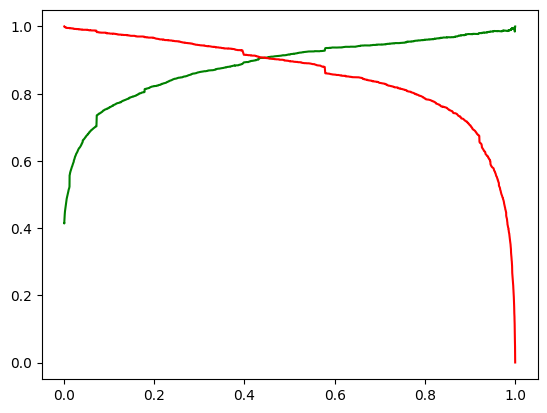

In [110]:
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

### Step 11: Making predictions on the test set

In [111]:
X_test[['TotalVisits','Total Time Spent on Website', 'Page Views Per Visit']] = scaler.transform(X_test[['TotalVisits','Total Time Spent on Website', 'Page Views Per Visit']])

In [112]:
X_test = X_test[col]
X_test.head()

,Do Not Email,Total Time Spent on Website,Search,A free copy of Mastering The Interview,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_NC_EDM,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Welingak Website,Lead Source_google,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Form Submitted on Website,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Page Visited on Website,Last Activity_Resubscribed to emails,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,Country_Australia,Country_Canada,Country_Germany,Country_Italy,Country_Oman,Country_Saudi Arabia,Country_Singapore,Country_South Africa,Country_United Arab Emirates,Country_United Kingdom,Country_United States,Country_unknown,Specialization_E-COMMERCE,Specialization_Healthcare Management,Specialization_IT Projects Management,Specialization_Marketing Management,Specialization_Operations Management,Specialization_Rural and Agribusiness,Specialization_Supply Chain Management,Specialization_Travel and Tourism,How did you hear about X Education_Multiple Sources,How did you hear about X Education_Other,How did you hear about X Education_SMS,How did you hear about X Education_Student of SomeSchool,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Working Professional,What matters most to you in choosing a course_Better career prospects,Tags_Busy,Tags_Closed by Horizzon,Tags_Diploma holder (Not Eligible),Tags_Interested in full time MBA,Tags_Interested in Next batch,Tags_Interested in other courses,Tags_Lateral student,Tags_Lost to EINS,Tags_Lost to Others,Tags_Not doing further education,Tags_Ringing,Tags_Want to take admission but has financial problems,Tags_in touch with EINS,Tags_invalid number,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,Lead Quality_Might be,Lead Quality_Not Sure,Lead Quality_Worst,Lead Profile_Lateral Student,Lead Profile_Other Leads,Lead Profile_Potential Lead,Lead Profile_Student of SomeSchool,City_Tier II Cities
3271,0,-0.600595,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1490,0,1.887326,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
7936,0,-0.752879,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4216,0,-0.888650,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
3830,0,-0.587751,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [113]:
X_test_sm = sm.add_constant(X_test)

Making predictions on the test set

In [114]:
y_test_pred = res.predict(X_test_sm)

In [115]:
y_test_pred[:10]

3271    0.039463
1490    0.989391
7936    0.033144
4216    0.998946
3830    0.018574
1800    0.870823
6507    0.006112
4821    0.001394
4223    0.955067
4714    0.395444
dtype: float64

In [116]:
# Converting y_pred to a dataframe which is an array
y_pred_1 = pd.DataFrame(y_test_pred)

In [117]:
# Let's see the head
y_pred_1.head()

,0
3271,0.039463
1490,0.989391
7936,0.033144
4216,0.998946
3830,0.018574


In [131]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

In [132]:
# Putting CustID to index
y_test_df['Lead Number'] = y_test_df.index

In [133]:
# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

In [134]:
# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)

In [135]:
y_pred_final.head()

,Converted,Lead Number,0
0,0,3271,0.039463
1,1,1490,0.989391
2,0,7936,0.033144
3,1,4216,0.998946
4,0,3830,0.018574


In [136]:
# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 0 : 'Converted_Prob'})

In [138]:
# Let's see the head of y_pred_final
y_pred_final.head()

,Converted,Lead Number,Converted_Prob
0,0,3271,0.039463
1,1,1490,0.989391
2,0,7936,0.033144
3,1,4216,0.998946
4,0,3830,0.018574


In [140]:
y_pred_final['final_predicted'] = y_pred_final.Converted_Prob.map(lambda x: 1 if x > 0.38 else 0)

In [141]:
y_pred_final.head()

,Converted,Lead Number,Converted_Prob,final_predicted
0,0,3271,0.039463,0
1,1,1490,0.989391,1
2,0,7936,0.033144,0
3,1,4216,0.998946,1
4,0,3830,0.018574,0


In [143]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_pred_final.Converted, y_pred_final.final_predicted)

0.9103929489533603

In [145]:
confusion2 = metrics.confusion_matrix(y_pred_final.Converted, y_pred_final.final_predicted )
confusion2

array([[1570,  164],
       [  80,  909]])

In [146]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [147]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.9191102123356926

In [148]:
# Let us calculate specificity
TN / float(TN+FP)

0.9054209919261822